# INF2008 Group P5-1 
# Singapore HDB Resale Price Prediction

# 1. Problem Statement

HDB flats are often labelled as the government's first gift to Singaporeans, leading majority of the population living in them. While many Singaporeans acquire their homes through the Build-to-Order (BTO) scheme, a considerable number of people choose to purchase flats on the resale market due to various reasons.

Throughout the years, it has become a known fact that purchasing a home is often the largest financial decision most people will make, it is essential to ensure that the price paid reflects the property's true value. Overpaying for a flat could lead to significant financial setbacks, sometimes amounting to tens or even hundreds of thousands of dollars.

Determining the right price for a HDB resale flat is complicated, as there are many factors that influence housing prices, giving buyers a hard time in determining the best home for their future. This project aims to tackle the challenge of accurately estimating resale values.

Key Question:
**<center>How can we effectively forecast the resale price of an HDB flat using relevant data?</center>**

This initiative seeks to empower buyers by providing clarity on the factors that drive resale prices, helping them make sound financial decisions when selecting resale flats. To achieve this, a linear regression model will be utilized, with resale price as the outcome variable and key housing-related factors as predictors.

Model performance will be evaluated using the Root Mean Square Error (RMSE), where a smaller RMSE reflects better predictive accuracy.

The project’s primary beneficiaries are home buyers seeking guidance on fair pricing. Additionally, housing agents, who play a critical role in advising buyers, will also find the insights valuable.

# 2. Data Collection

### 2.1 Data Import

Let us start off by importing the combined dataset.

In [2]:
%pip install pandas matplotlib numpy plotly nbformat seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
# Importing data.
df = pd.read_csv('../dataset/combined_data.csv')

In [5]:
print(df.shape)
df.head(10)

(235565, 11)


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0
5,2015-01,ANG MO KIO,3 ROOM,603,ANG MO KIO AVE 5,07 TO 09,67.0,New Generation,1980,64,290000.0
6,2015-01,ANG MO KIO,3 ROOM,709,ANG MO KIO AVE 8,01 TO 03,68.0,New Generation,1980,64,290000.0
7,2015-01,ANG MO KIO,3 ROOM,333,ANG MO KIO AVE 1,01 TO 03,68.0,New Generation,1981,65,293000.0
8,2015-01,ANG MO KIO,3 ROOM,109,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,62,300000.0
9,2015-01,ANG MO KIO,3 ROOM,564,ANG MO KIO AVE 3,13 TO 15,68.0,New Generation,1985,69,307500.0


As shown above, we have a total of up to 235,565 datasets with 11 columns, now we will walk through the data cleaning process.

# 3 Data Preprocessing 

### 3.1 Handling Duplicate Values

In [6]:
df.duplicated().sum()
df[df.duplicated()]

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
661,2015-01,KALLANG/WHAMPOA,3 ROOM,57,GEYLANG BAHRU,16 TO 18,65.0,Improved,1974,58,315000.0
2166,2015-02,TAMPINES,3 ROOM,403,TAMPINES ST 41,07 TO 09,69.0,Improved,1985,69,350000.0
3896,2015-04,BEDOK,4 ROOM,701,BEDOK RESERVOIR RD,10 TO 12,93.0,New Generation,1980,64,400000.0
4246,2015-04,CLEMENTI,3 ROOM,714,CLEMENTI WEST ST 2,10 TO 12,67.0,New Generation,1980,64,300000.0
5493,2015-05,BEDOK,3 ROOM,409,BEDOK NTH AVE 2,07 TO 09,68.0,New Generation,1980,63,340000.0
...,...,...,...,...,...,...,...,...,...,...,...
225347,2024-10,SENGKANG,4 ROOM,329B,ANCHORVALE ST,10 TO 12,93.0,Model A,2015,89 years 11 months,695000.0
226620,2024-05,SENGKANG,5 ROOM,430D,FERNVALE LINK,19 TO 21,112.0,Improved,2015,90 years 01 month,770000.0
228223,2024-12,TAMPINES,4 ROOM,612A,TAMPINES NTH DR 1,10 TO 12,93.0,Model A,2020,94 years 11 months,780000.0
233098,2024-01,YISHUN,4 ROOM,462C,YISHUN AVE 6,01 TO 03,93.0,Model A,2019,94 years 08 months,530000.0


As reflected, we have identified 321 rows x 11 columns of duplicated data, now let us drop the duplicated data.

In [7]:
df = df.drop_duplicates()

# Looking for columns with null values
df.isnull().sum()

month                  0
town                   0
flat_type              0
block                  0
street_name            0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64

As shown above, we have detected no null values within the dataset.

### 3.2 Transforming remaining_lease

Due to the combination of datasets, we have identified that the remaining_lease columns are not consistent in terms of the units defined. Therefore, we decided to normalise them in years format.

In [8]:
# Calculate remaining lease using lease commence date
current_year = 2025  # Replace with the relevant current year
df['remaining_lease'] = 99 - (current_year - df['lease_commence_date'])

# Ensure no negative values (clip to 0 for expired leases)
df['remaining_lease'] = df['remaining_lease'].clip(lower=0)

In [9]:
df.tail(10) #The last 10 rows

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
235555,2025-01,YISHUN,5 ROOM,238,YISHUN RING RD,01 TO 03,127.0,Improved,1985,59,650000.0
235556,2025-01,YISHUN,5 ROOM,109,YISHUN RING RD,07 TO 09,121.0,Improved,1982,56,695000.0
235557,2025-01,YISHUN,5 ROOM,297,YISHUN ST 20,01 TO 03,111.0,Improved,2000,74,608000.0
235558,2025-01,YISHUN,5 ROOM,265,YISHUN ST 22,01 TO 03,122.0,Improved,1986,60,625000.0
235559,2025-01,YISHUN,5 ROOM,511B,YISHUN ST 51,10 TO 12,113.0,Improved,2017,91,730000.0
235560,2025-01,YISHUN,5 ROOM,502B,YISHUN ST 51,07 TO 09,112.0,Improved,2018,92,776000.0
235561,2025-01,YISHUN,5 ROOM,871,YISHUN ST 81,07 TO 09,122.0,Improved,1988,62,738000.0
235562,2025-01,YISHUN,5 ROOM,851,YISHUN ST 81,10 TO 12,127.0,Improved,1988,62,740000.0
235563,2025-01,YISHUN,EXECUTIVE,352,YISHUN RING RD,04 TO 06,146.0,Maisonette,1988,62,1008000.0
235564,2025-01,YISHUN,EXECUTIVE,614,YISHUN ST 61,04 TO 06,146.0,Maisonette,1987,61,800000.0


Using this example, this is to illustrate the changes made for remaining_lease on the second half of the dataset from years and months into years only.

### 3.3 Handling Data Types

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 235244 entries, 0 to 235564
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                235244 non-null  object 
 1   town                 235244 non-null  object 
 2   flat_type            235244 non-null  object 
 3   block                235244 non-null  object 
 4   street_name          235244 non-null  object 
 5   storey_range         235244 non-null  object 
 6   floor_area_sqm       235244 non-null  float64
 7   flat_model           235244 non-null  object 
 8   lease_commence_date  235244 non-null  int64  
 9   remaining_lease      235244 non-null  int64  
 10  resale_price         235244 non-null  float64
dtypes: float64(2), int64(2), object(7)
memory usage: 21.5+ MB


### 3.4 Transforming storey_range



As storey_range are values that are categorical e.g. 4 TO 6, we need to transform them to a median value such that it allows us to have more accurate insights when identifying trends or relationships as the different storey levels affects HDB prices. By transforming them to numerical data allows us to have an easier time when creating our models.

In [11]:
# Transform storey_range values to median values

def convert_to_median(row):
	storey_range = row["storey_range"].split(" TO ")
	median = (int(storey_range[0]) + int(storey_range[1])) / 2
	return median

df["median_storey"] = df.apply(convert_to_median, axis=1)
df = df.drop(columns=['storey_range'])

In [12]:
df.tail()

,month,town,flat_type,block,street_name,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,median_storey
235560,2025-01,YISHUN,5 ROOM,502B,YISHUN ST 51,112.0,Improved,2018,92,776000.0,8.0
235561,2025-01,YISHUN,5 ROOM,871,YISHUN ST 81,122.0,Improved,1988,62,738000.0,8.0
235562,2025-01,YISHUN,5 ROOM,851,YISHUN ST 81,127.0,Improved,1988,62,740000.0,11.0
235563,2025-01,YISHUN,EXECUTIVE,352,YISHUN RING RD,146.0,Maisonette,1988,62,1008000.0,5.0
235564,2025-01,YISHUN,EXECUTIVE,614,YISHUN ST 61,146.0,Maisonette,1987,61,800000.0,5.0


In [13]:
analysisDF = df # For analysis
analysisDF.head()

,month,town,flat_type,block,street_name,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,median_storey
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,60.0,Improved,1986,60,255000.0,8.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,68.0,New Generation,1981,55,275000.0,2.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,69.0,New Generation,1980,54,285000.0,2.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,68.0,New Generation,1979,53,290000.0,2.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,68.0,New Generation,1980,54,290000.0,8.0


# 4 Data Analysis

### 4.1 Distribution of Dependent Variables

In [14]:
analysisDF['resale_price'].describe()

count    2.352440e+05
mean     4.977054e+05
std      1.741972e+05
min      1.400000e+05
25%      3.700000e+05
50%      4.638880e+05
75%      5.950000e+05
max      1.600000e+06
Name: resale_price, dtype: float64

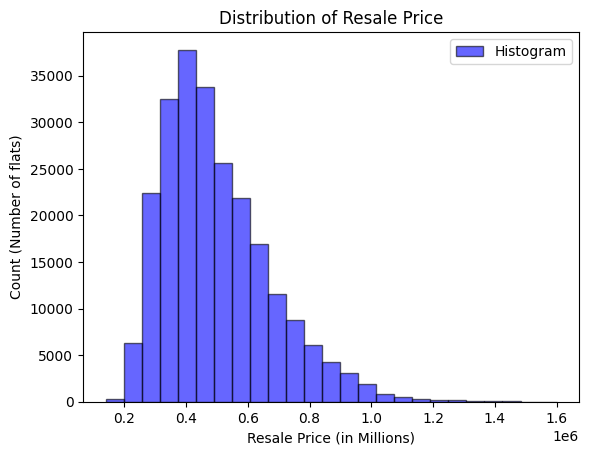

In [15]:
data = analysisDF['resale_price']
plt.hist(data, bins=25, alpha=0.6, color='b', edgecolor='black', label='Histogram')

plt.title('Distribution of Resale Price')
plt.xlabel('Resale Price (in Millions)')
plt.ylabel('Count (Number of flats)')

plt.legend()

plt.show()

Interpretation: The resale price distribution is slightly left-skewed, with the majority of flats priced in the lower range. However, the tail extends toward higher prices, indicating the presence of some higher-value properties, which aligns with the trends observed in the summary statistics.

Let us get a better understanding of our resale price by breaking it across features.

C:\Users\OJKJ\AppData\Local\Temp\ipykernel_35888\2139689074.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


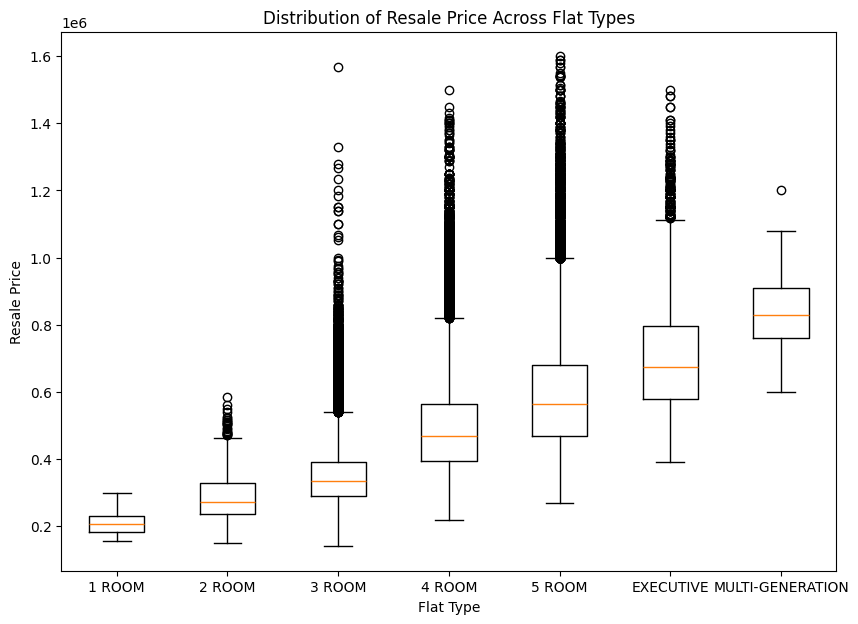

In [16]:
flat_type_order = ['1 ROOM', '2 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'MULTI-GENERATION']

# Reorder the data to follow the specified flat type order
analysisDF['flat_type'] = pd.Categorical(analysisDF['flat_type'], categories=flat_type_order, ordered=True)
analysisDF = analysisDF.sort_values('flat_type')

plt.figure(figsize=(10, 7))
plt.boxplot(
    [analysisDF.loc[df['flat_type'] == flat_type, 'resale_price'] for flat_type in flat_type_order],
    labels=flat_type_order
)

plt.title('Distribution of Resale Price Across Flat Types')
plt.xlabel('Flat Type')
plt.ylabel('Resale Price')

plt.show()

Larger flat types generally have higher resale prices, with 1 ROOM and 2 ROOM flats being the cheapest and EXECUTIVE and MULTI-GENERATION flats being the most expensive. Smaller flats have more consistent prices, while larger ones show more variation and include higher-priced outliers. Some 5 ROOM and EXECUTIVE flats are priced over $1.5 million, likely due to premium locations or features.

C:\Users\OJKJ\AppData\Local\Temp\ipykernel_35888\234786280.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, vert=False, labels=towns)


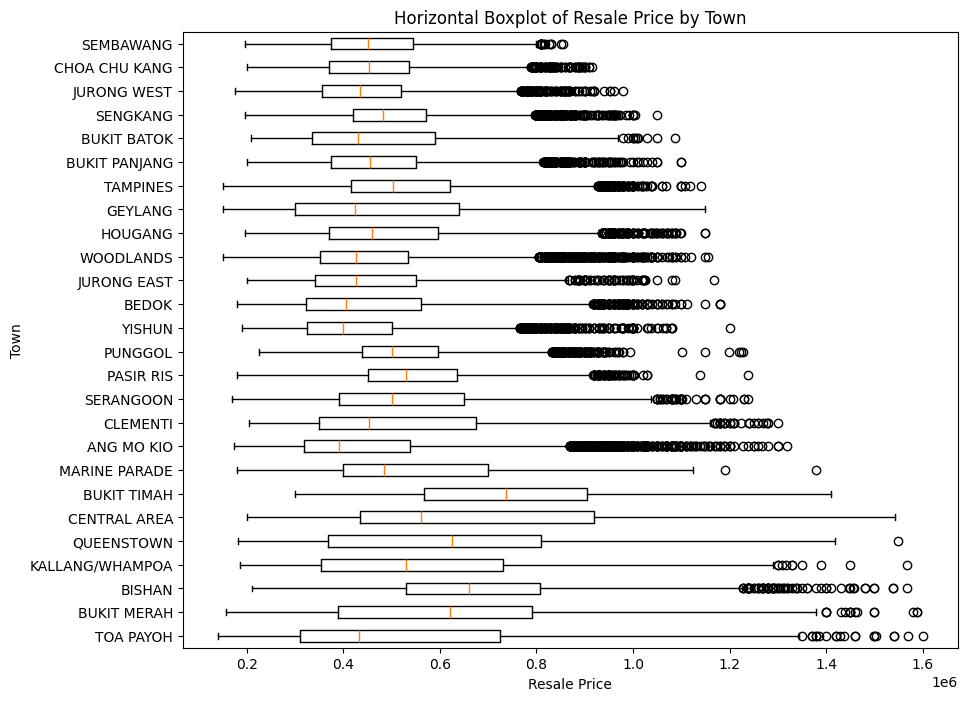

In [17]:
# Sort the DataFrame by resale_price
sorted_df = analysisDF.sort_values(by='resale_price', ascending=False)

# Get unique towns
towns = sorted_df['town'].unique()

data = [sorted_df.loc[sorted_df['town'] == town, 'resale_price'] for town in towns]

plt.figure(figsize=(10, 8))
plt.boxplot(data, vert=False, labels=towns)

plt.xlabel('Resale Price') 
plt.ylabel('Town') 
plt.title('Horizontal Boxplot of Resale Price by Town') 

plt.show()

Interpretation: Resale prices vary a lot depending on the location and nearby facilities. Central towns like Bukit Timah, Queenstown, and Central Area are more expensive because they’re closer to the city, well-connected, and have more amenities. Suburban towns like Sembawang and Choa Chu Kang are cheaper since they’re farther from the city and less developed. Prices can also go up in towns near MRT stations, good schools, or malls. The high-priced outliers in some towns might be due to unique features or very desirable locations.

## 4.2 Scatterplots of Strongest Independent Varables against Dependent Variables

### 4.2.1 Relationship between Floor Area and Resale Price

In [18]:
import plotly.express as px
import nbformat


scatterplt = px.scatter(
    analysisDF,
    x='floor_area_sqm',
    y='resale_price',
    color='flat_type',  # Optional: Add this for color differentiation
    title='Relationship Between Floor Area and Resale Price',
    width=900,
    height=800
)

scatterplt.show()



Interpretation: The scatterplot reveals a clear positive relationship between floor area and resale price, indicating that larger flats tend to have higher resale prices. Smaller flats, such as 1 ROOM and 2 ROOM, are concentrated in the lower left of the plot, with smaller floor areas and lower resale prices. In contrast, larger flats like EXECUTIVE and MULTI-GENERATION are positioned in the upper right, reflecting their bigger floor areas and significantly higher prices. Each flat type forms distinct clusters, suggesting that floor area strongly correlates with both the flat type and its price. However, there are some outliers, where certain flats have much higher prices than expected for their size, likely due to other factors such as location, condition, or special features. Overall, the plot highlights that while larger floor areas generally lead to higher prices, other variables also play a role in determining resale value.

### 4.2.2 Relationship between Lease Commence Date and Resale Price

In [19]:
# Group by 'lease_commence_date' and calculate the average resale price
avg_price_by_lease = analysisDF.groupby('lease_commence_date')['resale_price'].mean().reset_index()

fig = px.line(
    avg_price_by_lease,
    x='lease_commence_date',
    y='resale_price',
    title='Average Resale Price by Lease Commencement Year',
    labels={
        'lease_commence_date': 'Lease Commencement Year',
        'resale_price': 'Average Resale Price'
    },
    width=900,
    height=600,
    markers=True 
)


fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    xaxis_tickangle=45, 
    template='plotly_white',
)

fig.show()

Interpretation: Flats with newer leases (1990s to 2010s) generally have higher resale prices because they’re in better condition and come with modern features. Older flats (before the 1990s) are usually cheaper because they have shorter leases left, making them less attractive to buyers. However, flats in prime locations or near amenities like MRT stations, schools, or malls can still be expensive, even if they’re older. Prices also change based on market demand and trends.

### 4.2.3 Relationship between Remaining Lease and Resale Price

In [20]:
fig = px.scatter(
    analysisDF,
    x='remaining_lease',
    y='resale_price',
    title='Resale Price vs. Remaining Lease',
    labels={'remaining_lease': 'Remaining Lease (Years)', 'resale_price': 'Resale Price'},
    width=900,
    height=600,
    opacity=0.6
)

fig.show()

Interpreation: Flats with longer remaining leases, especially those with over 80 years left, tend to have higher resale prices because they are more desirable and easier to finance. Flats with shorter remaining leases, particularly below 50 years, are generally cheaper since they are less attractive to buyers and have loan restrictions. However, some flats with short leases still sell at high prices, likely due to their prime location or proximity to key amenities like MRT stations or malls.

### 4.2.4 Final Dataset

This will be the dataset that we will be using for data analysis and most importantly, for our machine learning models.

In [21]:
# Drop lease_commence_date, street_name, block and month

df.drop(columns=['lease_commence_date', 'street_name', 'block', 'month'], inplace=True)
finalDf = df # For models
column_names = finalDf.columns
print(column_names)

Index(['town', 'flat_type', 'floor_area_sqm', 'flat_model', 'remaining_lease',
       'resale_price', 'median_storey'],
      dtype='object')


### 4.2.5 Correlation Matrix

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 235244 entries, 0 to 235564
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype   
---  ------           --------------   -----   
 0   town             235244 non-null  object  
 1   flat_type        235244 non-null  category
 2   floor_area_sqm   235244 non-null  float64 
 3   flat_model       235244 non-null  object  
 4   remaining_lease  235244 non-null  int64   
 5   resale_price     235244 non-null  float64 
 6   median_storey    235244 non-null  float64 
dtypes: category(1), float64(3), int64(1), object(2)
memory usage: 20.9+ MB


resale_price       1.000000
floor_area_sqm     0.587854
remaining_lease    0.380735
median_storey      0.351164
Name: resale_price, dtype: float64


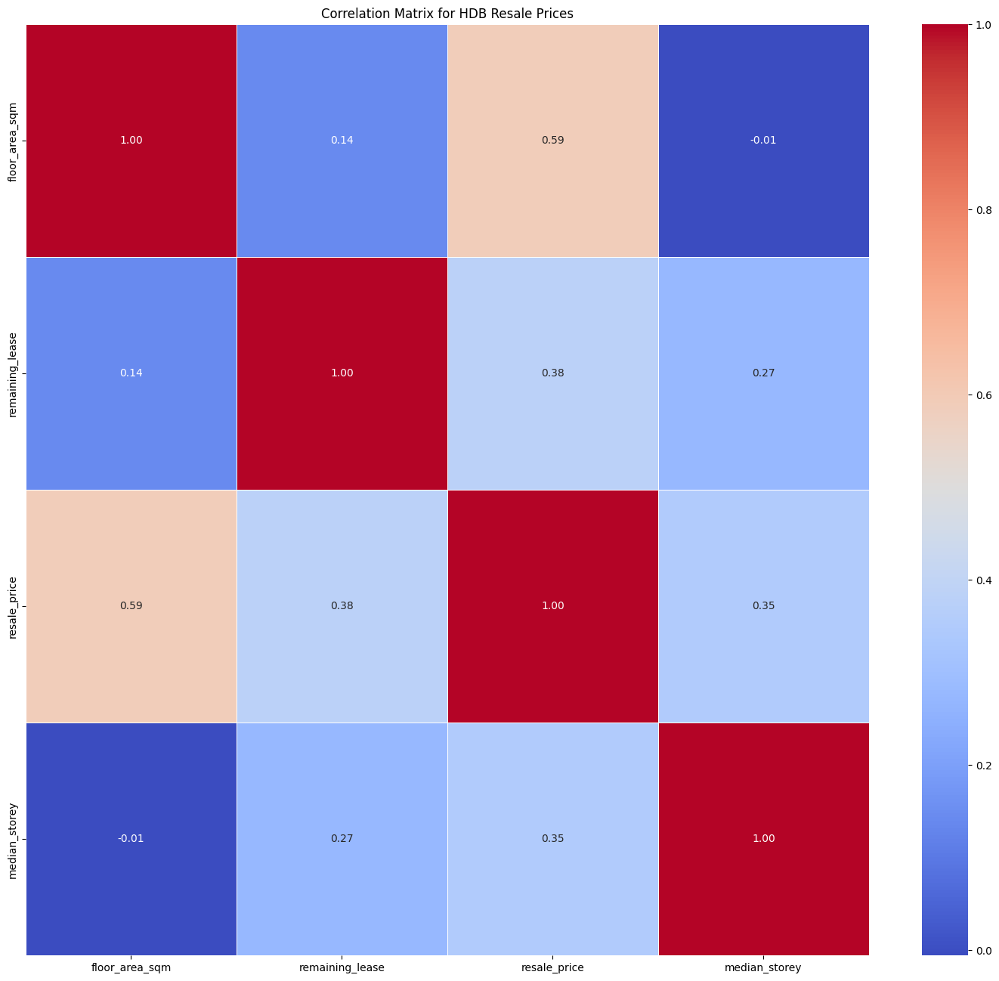

In [23]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


non_numeric_cols = ['town', 'flat_type', 'flat_model']
df_numeric = finalDf.drop(columns=non_numeric_cols, errors='ignore')

# Display correlation values of each feature with resale_price
corr_matrix = df_numeric.corr()
print(corr_matrix["resale_price"].sort_values(ascending=False))


plt.figure(figsize=(18, 16))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix for HDB Resale Prices")
plt.show()

Intepretation: This chart shows how different factors are related:

Flat size (floor area) have the strongest impact on resale price, as bigger flats tend to be more expensive. 
The remaining lease also plays a role in affecting resale prices i.e. newer flats, longer remaining lease are more expensive, but other factors such as location of the flat also matter.
The median storey of a unit affects resale prices as the higher you stay, the pricer the unit is.

# 5 Predictive Modelling

So our objective here is to build machine learning models to predict resale prices based on features that highly correlate to resale prices: floor area, remaining lease and median storey.

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer

features = finalDf.drop(columns=['resale_price'])
target = finalDf['resale_price']

categorical_features = ['town', 'flat_type', 'flat_model']
numerical_features = [col for col in features.columns if col not in categorical_features]

#Preprocessing Pipeline
preprocessor = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_features),
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)
])

#Split train-test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

Random Forest Regressor

In [55]:
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


📊 Random Forest Regressor R² Score: 0.82
📉 Random Forest Regressor RMSE: 74102.28


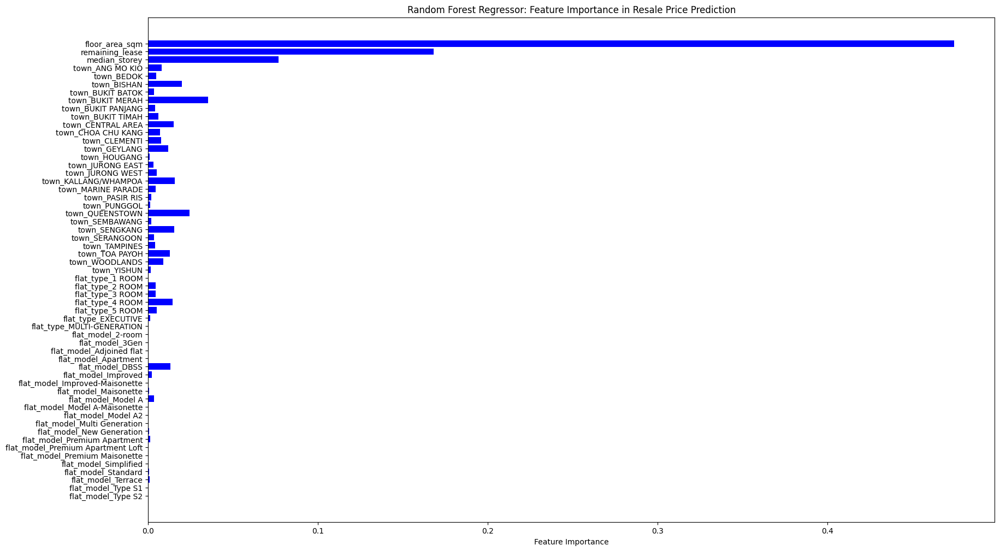

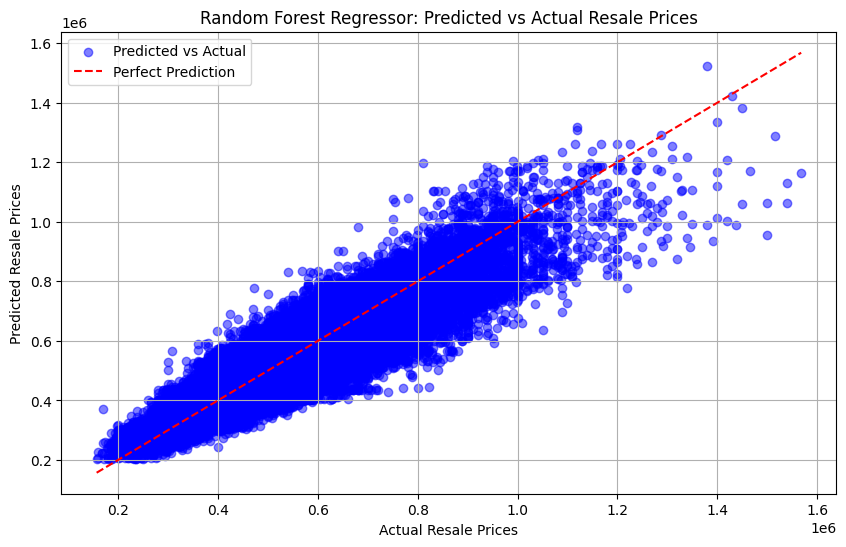

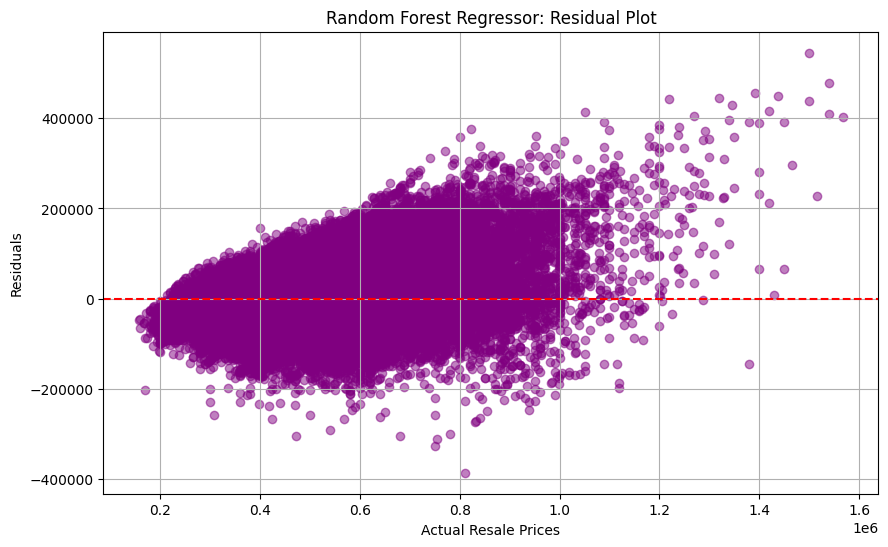

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error


rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=200, max_depth=20, n_jobs=-1, random_state=42))
])


rf_pipeline.fit(X_train, y_train)
y_pred = rf_pipeline.predict(X_test)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"📊 Random Forest Regressor R² Score: {r2:.2f}")
print(f"📉 Random Forest Regressor RMSE: {rmse:.2f}")

#Feature Importance Analysis
feature_names_rf = (
    numerical_features +
    list(rf_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)
feature_importance_rf = rf_pipeline.named_steps['regressor'].feature_importances_

plt.figure(figsize=(20, 12))
plt.barh(feature_names_rf, feature_importance_rf, color='blue')
plt.xlabel("Feature Importance")
plt.title("Random Forest Regressor: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()
plt.show()

#Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Random Forest Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

#Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Random Forest Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

Feature Importance Analysis:
The first chart shows which factors have the most influence on predicting resale prices. Floor area (sqm) is by far the most important feature, followed by the remaining lease and the median storey level of the flat. This suggests that larger flats and those with longer remaining lease durations tend to have higher resale values. While towns and flat types do have some impact, they play a much smaller role compared to these three main factors.

Predicted vs Actual Resale Prices:
The second chart compares the predicted resale prices to the actual prices. Each blue dot represents a transaction, with the red dashed line indicating a perfect prediction (where predicted price = actual price). The majority of predictions closely follow the red line, meaning the model is performing well. However, there are some points further away, indicating cases where the model overestimated or underestimated the price.

Residual Plot (Prediction Errors):
The third chart visualizes the errors in prediction. Residuals (differences between actual and predicted prices) should ideally be randomly scattered around the zero line (red dashed line). While the spread is relatively balanced, some larger errors are observed for higher-priced properties, meaning the model struggles slightly with very expensive flats. Nonetheless, the overall distribution suggests that the model is generally accurate.

Now that we have our R² Score and RMSE, we will now interpret the results.

R² Score Range:
1.0: Perfect fit (model explains all the variance).
0.0: Model explains no variance.
Negative: Model performs worse than a horizontal line (mean prediction).

Our R² score: 0.82

This suggests that 80% of the variance in resale prices is explained by the model. While this is decent, there is room for improvement.

Our RMSE Score: 74102.28

This means the model's predictions are, on average, off by approximately SGD 74,102.28, not very good.

Evaluate Model Suitability
Is an R² of 0.82 acceptable for our use case?
For deployment (e.g., resale price prediction tools), aim for higher accuracy.
Compare RMSE to the range of resale prices.
If typical resale prices range between SGD 300,000 and SGD 800,000, an error of ~SGD 70,000 might be tolerable but could still impact user trust in predictions.
Therefore, we must refine the model.

Linear Regression

📊 Linear Regression R² Score: 0.76
📉 Linear Regression RMSE: 85960.21
                              Feature   Coefficient
0                      floor_area_sqm  1.383610e+06
1                     remaining_lease  3.404468e+05
54                 flat_model_Terrace  2.658432e+05
9                    town_BUKIT TIMAH  2.245793e+05
2                       median_storey  2.160005e+05
18                 town_MARINE PARADE  1.755565e+05
10                  town_CENTRAL AREA  1.333161e+05
56                 flat_model_Type S2  1.329703e+05
21                    town_QUEENSTOWN  1.329354e+05
7                    town_BUKIT MERAH  1.274743e+05
5                         town_BISHAN  1.199504e+05
42     flat_model_Improved-Maisonette  1.069945e+05
17               town_KALLANG/WHAMPOA  8.761117e+04
26                     town_TOA PAYOH  8.138627e+04
55                 flat_model_Type S1  6.928613e+04
13                       town_GEYLANG  6.541359e+04
12                      town_CLEMENTI  5.56978

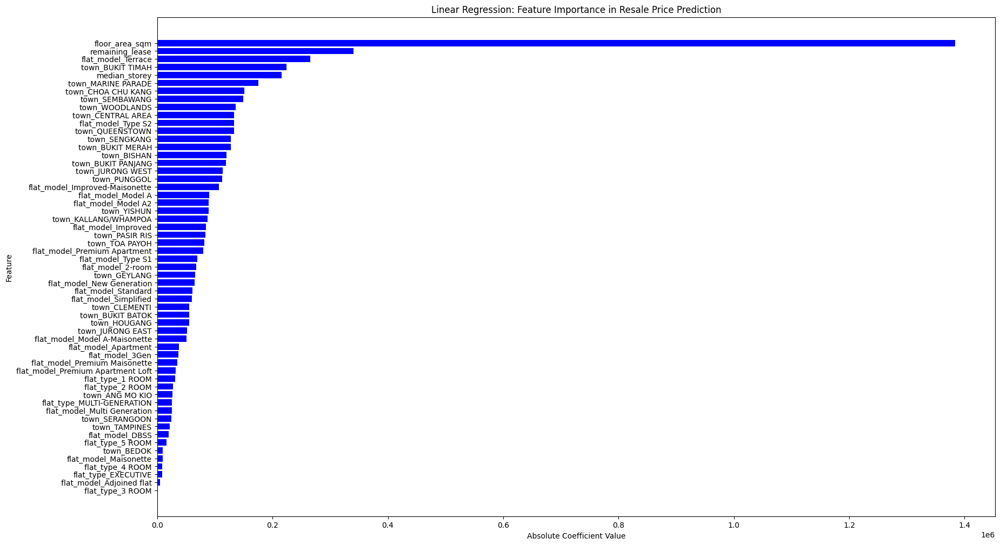

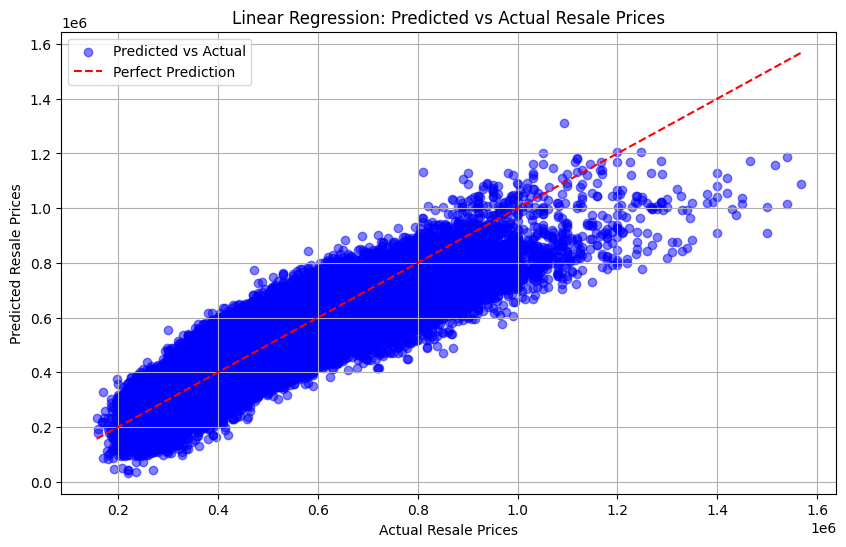

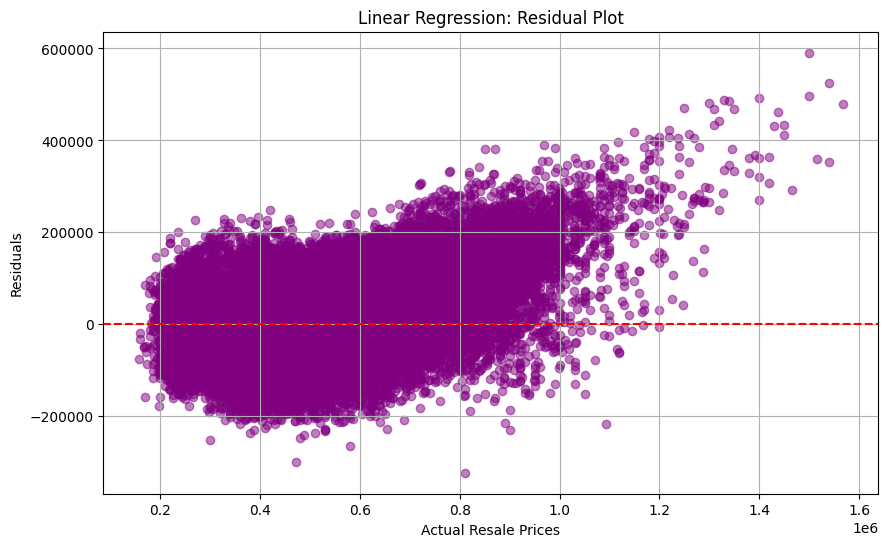

In [95]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error


lr_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

lr_pipeline.fit(X_train, y_train)

y_pred = lr_pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"📊 Linear Regression R² Score: {r2:.2f}")
print(f"📉 Linear Regression RMSE: {rmse:.2f}")

# Feature Importance Analysis
feature_names_lr = (
    numerical_features +
    list(lr_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)

# Get the coefficients from the linear regression model
coefficients = lr_pipeline.named_steps['regressor'].coef_

# Create a DataFrame to display coefficients
coef_df = pd.DataFrame({'Feature': feature_names_lr, 'Coefficient': coefficients})
coef_df = coef_df.sort_values(by="Coefficient", ascending=False)
print(coef_df)

# Take absolute values of coefficients to represent importance
coef_df["Absolute Coefficient"] = np.abs(coef_df["Coefficient"])
coef_df = coef_df.sort_values(by="Absolute Coefficient", ascending=False)

plt.figure(figsize=(20, 12))
plt.barh(coef_df["Feature"], coef_df["Absolute Coefficient"], color="blue")
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.title("Linear Regression: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.show()

#Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Linear Regression: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Linear Regression: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

The red dashed line represents perfect predictions, while blue dots show individual resale price predictions. Most points align well with the red line, indicating that the model captures the overall trend accurately, especially for lower-priced flats ($200k - $500k) where predictions are more consistent. However, for higher-priced flats ($800k - $1.4M), the spread increases, meaning the model overpredicts or underpredicts these values, likely due to missing features such as location within the town, flat condition, or nearby amenities (MRT, schools, malls, parks).

📊 Polynomial Regression R²: 0.81
📉 Polynomial Regression RMSE: 75958.05


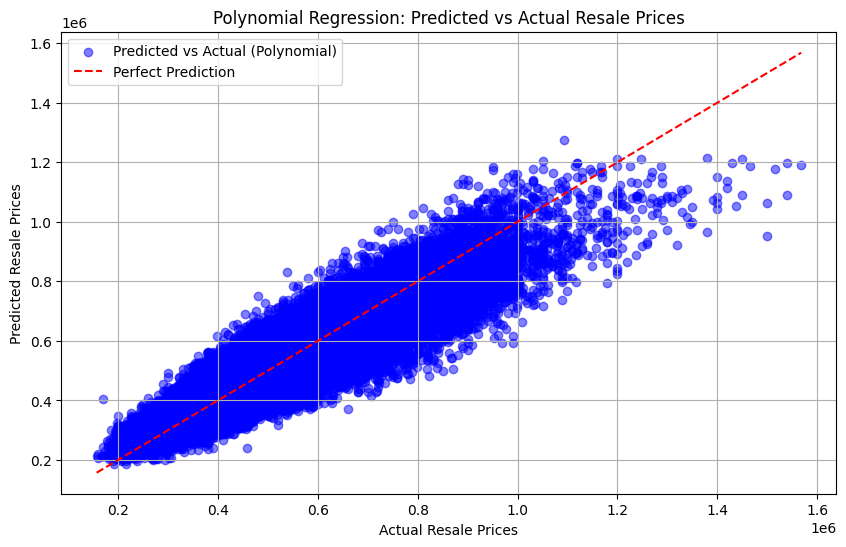

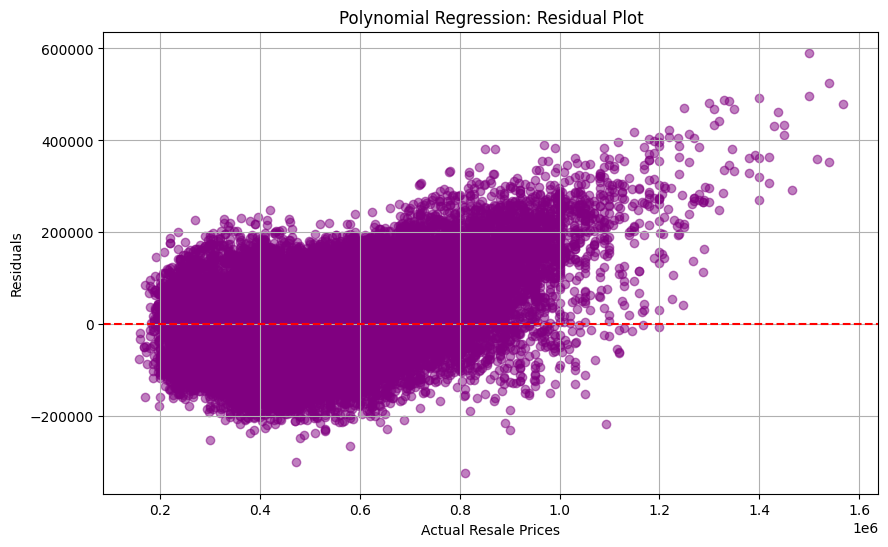

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

#Pipeline with polynomial features and linear regression
poly_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),  # Generate polynomial terms (quadratic)
    ('regressor', LinearRegression())
])


poly_pipeline.fit(X_train, y_train)
y_pred_poly = poly_pipeline.predict(X_test)

r2_poly = r2_score(y_test, y_pred_poly)
rmse_poly = np.sqrt(mean_squared_error(y_test, y_pred_poly))

print(f"📊 Polynomial Linear Regression R²: {r2_poly:.2f}")
print(f"📉 Polynomial Linear Regression RMSE: {rmse_poly:.2f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_poly, alpha=0.5, color='blue', label="Polynomial Linear Regression: Predicted vs Actual")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.title("Polynomial Linear Regression: Predicted vs Actual Resale Prices")
plt.legend()
plt.grid()
plt.show()

residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Polynomial Linear Regression: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

Compared to the previous Linear Regression model, the predictions are closer to the red line, indicating improved accuracy, especially for mid-range flats. However, there are still some overpredictions and underpredictions, particularly for higher-priced flats (~$800k - $1.4M), where the spread increases, suggesting the model may still miss key factors like location, amenities, or market trends. The dense cluster around lower prices ($200k - $600k) shows better alignment, meaning the model performs well for most resale flats

Decision Tree

Decision Tree Regressor Cross-Validation R² Scores: [0.80312254 0.80727848 0.80609928 0.8059882  0.80518965]
Decision Tree Regressor Mean R² Score: 0.81
🌳 Decision Tree Regressor R² Score: 0.81
📉 Decision Tree Regressor RMSE: 76344.52
                              Feature    Importance
0                      floor_area_sqm  4.757948e-01
1                     remaining_lease  1.699388e-01
2                       median_storey  7.226519e-02
7                    town_BUKIT MERAH  3.628177e-02
21                    town_QUEENSTOWN  2.467574e-02
5                         town_BISHAN  2.001462e-02
23                      town_SENGKANG  1.697293e-02
10                  town_CENTRAL AREA  1.496767e-02
17               town_KALLANG/WHAMPOA  1.486038e-02
32                   flat_type_4 ROOM  1.398390e-02
40                    flat_model_DBSS  1.307211e-02
26                     town_TOA PAYOH  1.253477e-02
13                       town_GEYLANG  1.215465e-02
27                     town_WOODLANDS

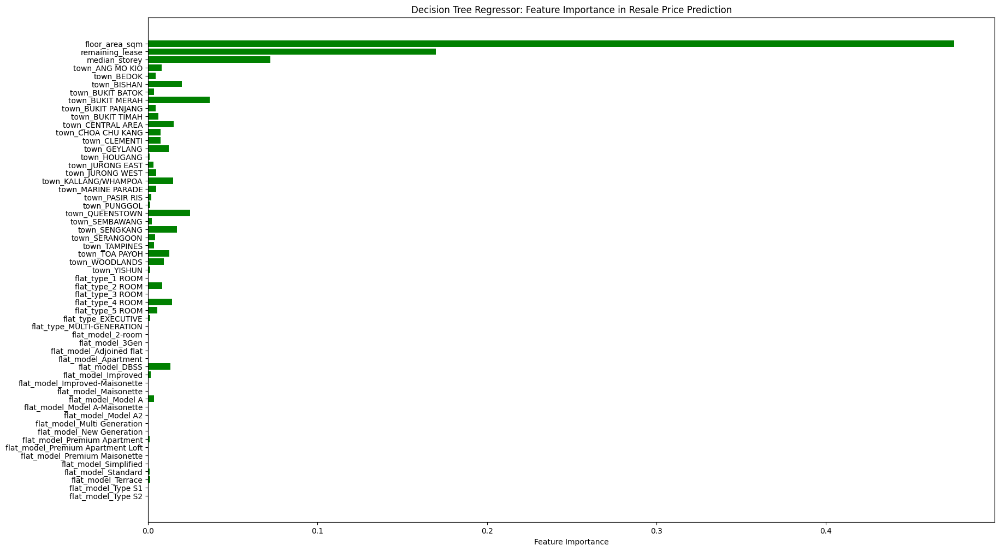

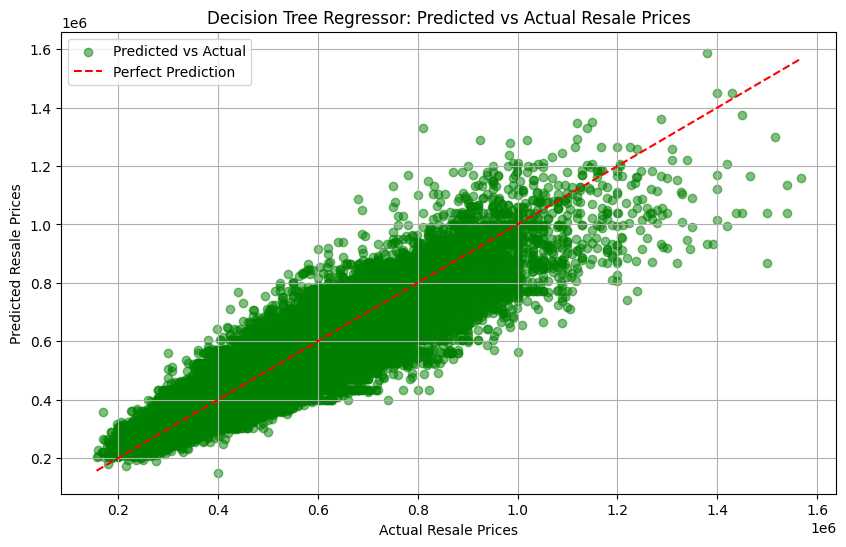

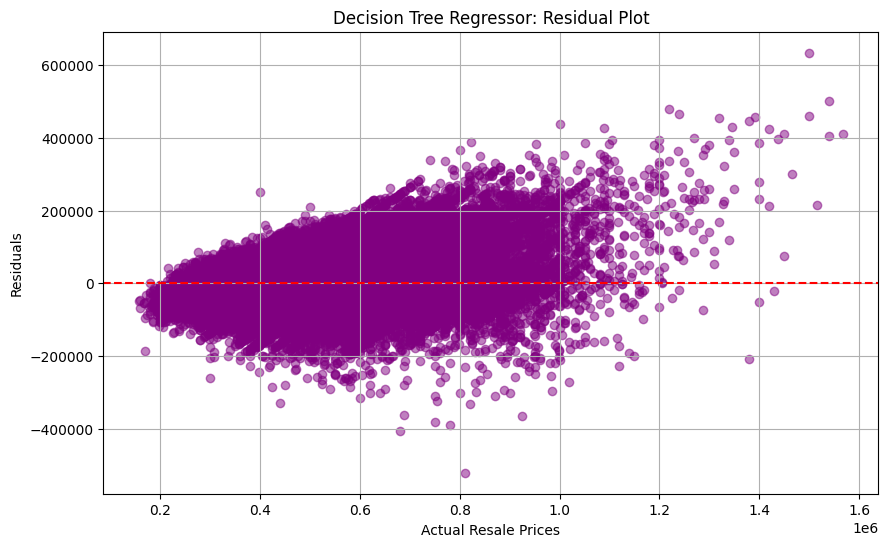

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score

# Define the Decision Tree pipeline
dt_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', DecisionTreeRegressor(max_depth=20, random_state=42))
])

# Train the model
dt_pipeline.fit(X_train, y_train)
y_pred = dt_pipeline.predict(X_test)

# Cross-validation for base model
base_cv_scores = cross_val_score(dt_pipeline, X_train, y_train, cv=5, scoring='r2')
print(f"Decision Tree Regressor Cross-Validation R² Scores: {base_cv_scores}")
print(f"Decision Tree Regressor Mean R² Score: {base_cv_scores.mean():.2f}")

# Compute evaluation metrics
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"🌳 Decision Tree Regressor R² Score: {r2:.2f}")
print(f"📉 Decision Tree Regressor RMSE: {rmse:.2f}")

# Feature Importance Analysis
feature_names_dt = (
    numerical_features +
    list(dt_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)
feature_importance_dt = dt_pipeline.named_steps['regressor'].feature_importances_

feature_importance_df = pd.DataFrame({'Feature': feature_names_dt, 'Importance': feature_importance_dt})
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# Print feature importance values
print(feature_importance_df)

plt.figure(figsize=(20, 12))
plt.barh(feature_names_dt, feature_importance_dt, color='green')
plt.xlabel("Feature Importance")
plt.title("Decision Tree Regressor: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()
plt.show()

# Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("Decision Tree Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("Decision Tree Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

Feature Importance Analysis:
Same as the first 2 models above, the floor area is the most important feature, with the remaining lease and the median storey level as the runner ups.

Predicted vs Actual Resale Prices:
There are many points that deviates from the perfect prediction line, suggesting prediction errors. The model overestimated and underestimated majority of the resale prices. More spread can be seen at higher prices, indicating that the model struggles with expensive properties.

Residual Plot (Prediction Errors):
The residuals increase in spread as the resale price increases. At lower prices (~ 0.2M-1.0M), the residuals are more tightly clustered compared with higher prices (>1.0M) where the residuals show greater varience. This suggests heteroscedasticity, where the model performs inconsistently across different price ranges i.e. the model has higher errors for expensive properties.


In [25]:
%pip install category_encoders

   ---------------------------------------- 0.0/9.8 MB ? eta -:--:--
   ------------------------ --------------- 6.0/9.8 MB 30.8 MB/s eta 0:00:01
   ---------------------------------------- 9.8/9.8 MB 29.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import category_encoders as ce
from sklearn.model_selection import GridSearchCV

# Improved Decision Tree Regressor
target_encoder = ce.TargetEncoder(cols=categorical_features)

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

X_train_encoded[categorical_features] = target_encoder.fit_transform(X_train[categorical_features], y_train)
X_test_encoded[categorical_features] = target_encoder.transform(X_test[categorical_features])  # Prevent leakage

preprocessor_target = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_features)  
], remainder='passthrough')  

dt_pipeline_target = Pipeline([
    ('preprocessor', preprocessor_target),
    ('regressor', DecisionTreeRegressor(max_depth=20, random_state=42))
])

# Cross-validation
target_cv_scores = cross_val_score(dt_pipeline_target, X_train_encoded, y_train, cv=5, scoring='r2')
print(f"Target Encoding Cross-Validation R² Scores: {target_cv_scores}")
print(f"Target Encoding Mean R² Score: {target_cv_scores.mean():.2f}")

# Train the improved model
dt_pipeline_target.fit(X_train_encoded, y_train)
y_pred_target = dt_pipeline_target.predict(X_test_encoded)

r2_target = r2_score(y_test, y_pred_target)
rmse_target = np.sqrt(mean_squared_error(y_test, y_pred_target))

print(f"Decision Tree Regressor after Target Encoding) R² Score: {r2_target:.2f}")
print(f"Decision Tree Regressor Target Encoding) RMSE: {rmse_target:.2f}")

# Define the parameter grid
dt_param_grid = {
    'regressor__max_depth': [10, 15, 20, 25],
    'regressor__min_samples_split': [2, 4, 6, 8, 10, 15, 20],
    'regressor__min_samples_leaf': [1, 2, 3, 4],
    'regressor__max_features': ['sqrt', 'log2', None]
}

# Perform grid search
dt_grid_search = GridSearchCV(dt_pipeline_target, dt_param_grid, cv=5, scoring='r2', error_score='raise')
dt_grid_search.fit(X_train_encoded, y_train)

print(f"Best Parameters: {dt_grid_search.best_params_}")
dt_final = dt_grid_search.best_estimator_

y_pred_best = dt_final.predict(X_test_encoded)
r2_best = r2_score(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
print(f"Best Model R² Score: {r2_best:.2f}")
print(f"Best Model RMSE: {rmse_best:.2f}")



Target Encoding Cross-Validation R² Scores: [0.80855984 0.81212497 0.81385532 0.80944239 0.81119127]
Target Encoding Mean R² Score: 0.81
Decision Tree Regressor after Target Encoding) R² Score: 0.81
Decision Tree Regressor Target Encoding) RMSE: 74929.76
Best Parameters: {'regressor__max_depth': 20, 'regressor__max_features': None, 'regressor__min_samples_leaf': 4, 'regressor__min_samples_split': 20}
Best Model R² Score: 0.83
Best Model RMSE: 72648.16


XGBoost

In [97]:
%pip install xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


📊 R² Score: 0.81
📉 RMSE: 74959.88


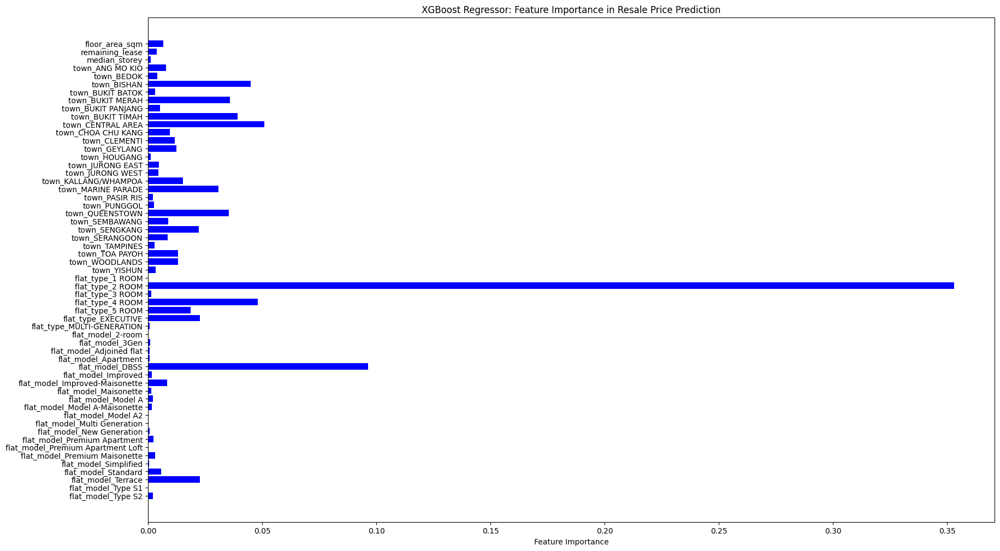

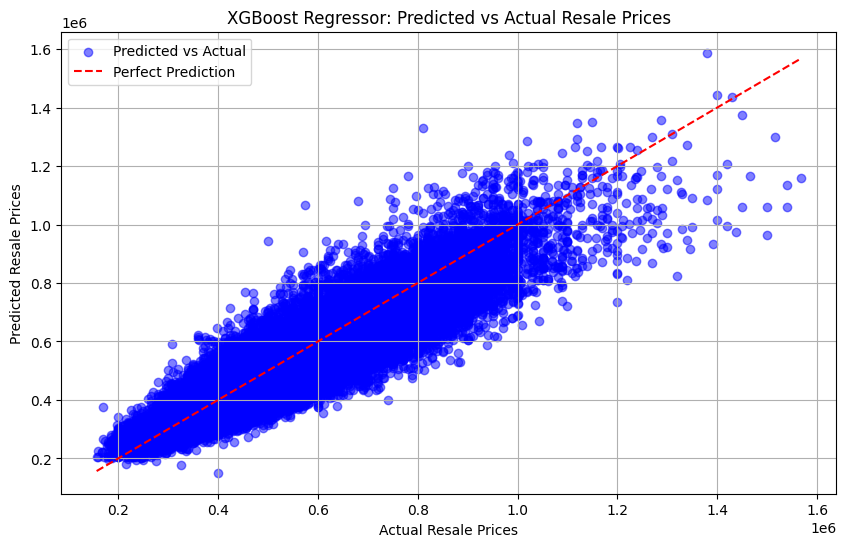

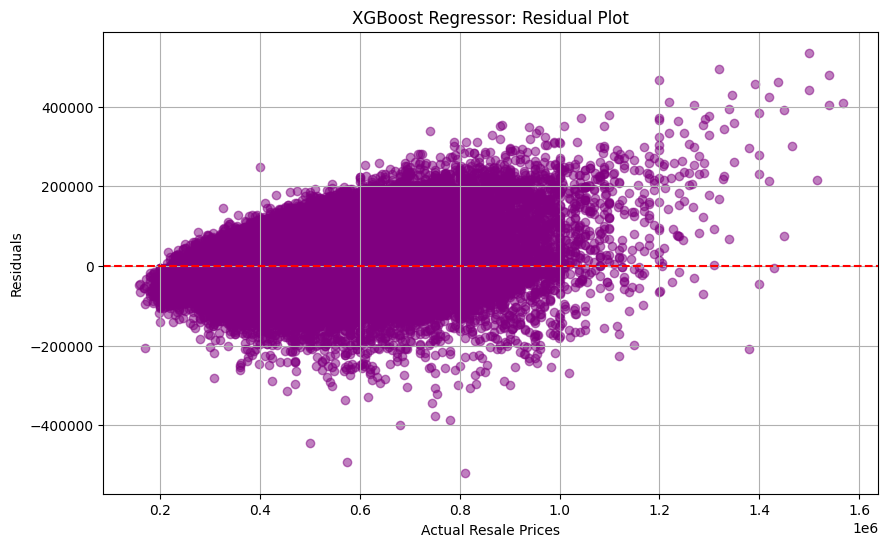

In [98]:
from xgboost import XGBRegressor

xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(n_estimators=200, max_depth=20, learning_rate=0.1, n_jobs=-1, random_state=42))
])

xgb_pipeline.fit(X_train, y_train)
y_pred = xgb_pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"📊 R² Score: {r2:.2f}")
print(f"📉 RMSE: {rmse:.2f}")

# 🔹 Step 10: Feature Importance Analysis
feature_names_xgb = (
    numerical_features +
    list(xgb_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
)
feature_importance_xgb = xgb_pipeline.named_steps['regressor'].feature_importances_

plt.figure(figsize=(20, 12))
plt.barh(feature_names_xgb, feature_importance_xgb, color='blue')
plt.xlabel("Feature Importance")
plt.title("XGBoost Regressor: Feature Importance in Resale Price Prediction")
plt.gca().invert_yaxis()
plt.show()

#Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("XGBoost Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

#Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("XGBoost Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

XGBoost with Gridsearch

In [99]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search
param_grid = {
    'regressor__n_estimators': [100, 200, 300],  # Number of trees
    'regressor__max_depth': [10, 15, 20],        # Depth of each tree
    'regressor__learning_rate': [0.05, 0.1, 0.15],  # Step size shrinkage
    'regressor__subsample': [0.7, 0.8, 0.9],     # Subsample ratio of the training instance.
    'regressor__colsample_bytree': [0.7, 0.8, 0.9]  # Subsample ratio of columns when constructing each tree.
}

# Setup the GridSearchCV
grid_search = GridSearchCV(xgb_pipeline, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("Best parameters found: ", grid_search.best_params_)
print(f"📊 R² Score of the best model: {r2:.2f}")
print(f"📉 RMSE of the best model: {rmse:.2f}")


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters found:  {'regressor__colsample_bytree': 0.7, 'regressor__learning_rate': 0.05, 'regressor__max_depth': 10, 'regressor__n_estimators': 300, 'regressor__subsample': 0.9}
📊 R² Score of the best model: 0.84
📉 RMSE of the best model: 70427.44


AdaBoost

AdaBoost MAE: 61502.840311114276
AdaBoost RMSE: 75642.66180670749
AdaBoost R² Score: 0.8114477870428192


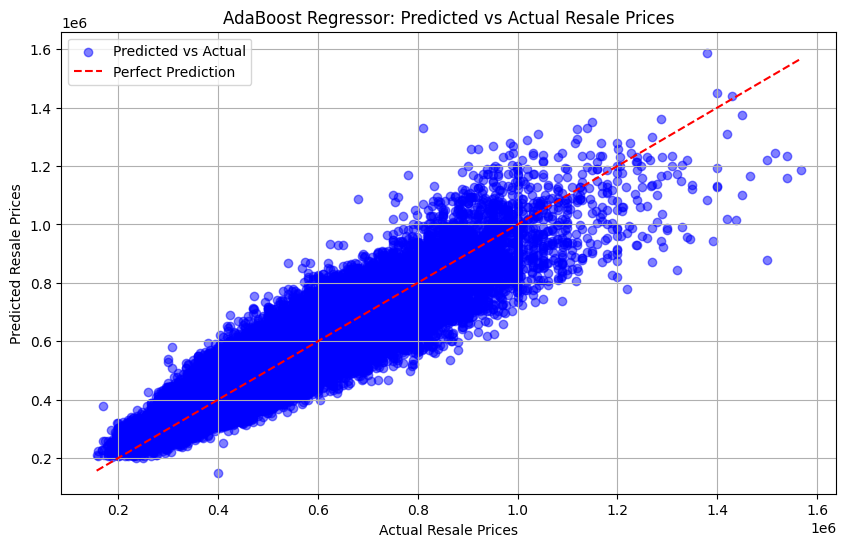

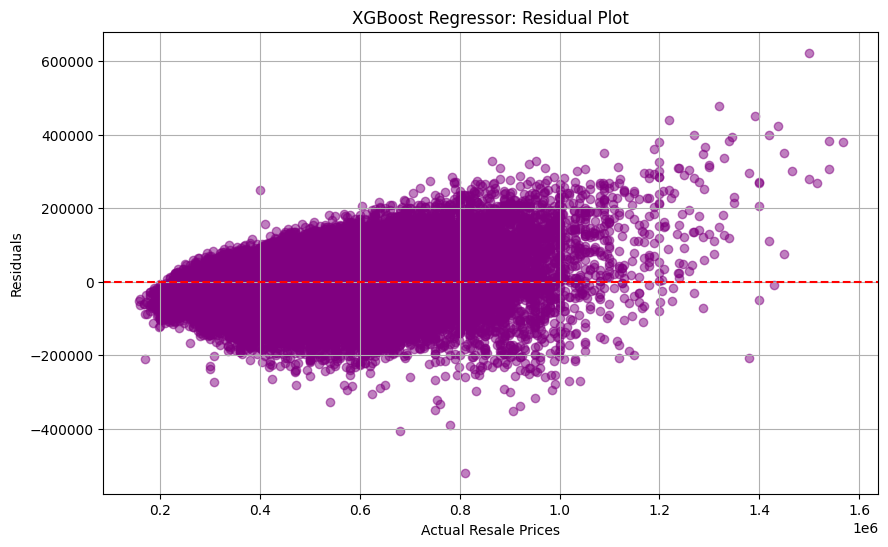

In [27]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Train AdaBoost Regressor
base_model = DecisionTreeRegressor(max_depth=20, random_state=42)  # Base estimator
ada_pipeline = Pipeline([
    ('preprocessor', preprocessor),  
    ('regressor', AdaBoostRegressor(
        estimator=base_model,  
        n_estimators=200,  
        learning_rate=0.1,  
        random_state=42
    ))
])

# grid_search = GridSearchCV(
#     estimator=ada_model,
#     param_grid=param_grid,  # Tests all 16 combinations
#     cv=3,
#     scoring='neg_mean_absolute_error',
#     verbose=1,
#     n_jobs=-1
# )

ada_pipeline.fit(X_train, y_train)

# Get best model
#best_model = grid_search.best_estimator_

# Make predictions with the optimized model
y_pred_best = ada_pipeline.predict(X_test)

# Evaluate optimized model
mae_best = mean_absolute_error(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
r2_best = r2_score(y_test, y_pred_best)

print(f"AdaBoost MAE: {mae_best}")
print(f"AdaBoost RMSE: {rmse_best}")
print(f"AdaBoost R² Score: {r2_best}")

#Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("AdaBoost Regressor: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

#Residual Plot
residuals = y_test - y_pred_best
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("XGBoost Regressor: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

SVM

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error


svm_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1))
])

svm_pipeline.fit(X_train, y_train)
y_pred = svm_pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"📊 R² Score: {r2:.2f}")
print(f"📉 RMSE: {rmse:.2f}")

# 🔹 Step 11: Feature Importance Not Available for SVM
print("⚠ Note: SVM does not provide feature importance scores.")

# 🔹 Step 12: Predicted vs Actual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5, label="Predicted vs Actual", color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Perfect Prediction")
plt.title("SVM: Predicted vs Actual Resale Prices")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Predicted Resale Prices")
plt.legend()
plt.grid()
plt.show()

# 🔹 Step 13: Residual Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals, alpha=0.5, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title("SVM: Residual Plot")
plt.xlabel("Actual Resale Prices")
plt.ylabel("Residuals")
plt.grid()
plt.show()

The first chart compares the predicted resale prices to the actual prices. Each blue dot represents a transaction, while the red dashed line represents a perfect prediction where the predicted price matches the actual price. In this case, the majority of predictions fall below the red line, indicating that the model tends to underpredict higher-value properties. The predictions appear to flatten around the SGD 400K-600K range, suggesting that the model struggles to capture price variations in high-end flats. Additionally, several data points deviate significantly from the red line, meaning that in some cases, the model either overestimates or underestimates resale prices by a substantial margin.

The second chart, the residual plot, visualizes the errors in prediction. Ideally, residuals—the difference between actual and predicted prices—should be randomly scattered around the zero line (red dashed line). However, in this case, the residuals display a clear pattern, where errors tend to increase for higher-priced flats. This suggests that the SVR model underestimates expensive properties while overestimating lower-priced ones. Such a pattern indicates that the model may not be flexible enough to capture the full complexity of the resale market, particularly in areas where resale prices vary widely due to factors like location, lease duration, and flat type.

Overall, the model achieved an R² score of 0.43, meaning it explains 43% of the variance in resale prices. While this suggests that the model captures some general trends, there is significant room for improvement. The Root Mean Squared Error (RMSE) of SGD 130,983 indicates that, on average, the model’s predictions deviate by around SGD 131K, which is relatively high considering resale prices typically range between SGD 200K and SGD 1.4M. This level of error may impact the reliability of the model for real-world applications, especially for buyers and sellers who depend on accurate price estimates.

To enhance performance, the model could benefit from hyperparameter tuning by optimizing C, gamma, and epsilon in the SVR algorithm. Additionally, feature engineering could improve predictions by incorporating factors such as MRT proximity, transaction month, lease commencement year, and block-level attributes. Finally, exploring alternative models like XGBoost, LightGBM, or Neural Networks may help capture the non-linear relationships present in HDB resale prices, leading to more precise predictions across all price ranges.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline

# 🔹 Define SVR hyperparameter grid
param_grid = {
    'regressor__C': [10, 100],  # Regularization strength
    'regressor__gamma': [0.01, 0.1],  # Kernel coefficient
    'regressor__epsilon': [0.1, 1]  # Margin of error tolerance
}

# 🔹 Create pipeline (preprocessing + SVR)
model = Pipeline([
    ('preprocessor', preprocessor),  # Preprocessing pipeline from previous code
    ('regressor', SVR(kernel='rbf'))
])

# 🔹 Run Grid Search with 5-fold Cross-Validation
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# 🔹 Print Best Parameters
print("✅ Best Parameters:", grid_search.best_params_)

# 🔹 Train final model with best parameters
best_svr = grid_search.best_estimator_
y_pred_best = best_svr.predict(X_test)

# 🔹 Evaluate Improved Model
r2_best = r2_score(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))

print(f"📊 Improved R² Score: {r2_best:.2f}")
print(f"📉 Improved RMSE: SGD {rmse_best:.2f}")


Fitting 5 folds for each of 8 candidates, totalling 40 fits
✅ Best Parameters: {'regressor__C': 100, 'regressor__epsilon': 0.1, 'regressor__gamma': 0.1}
📊 Improved R² Score: 0.43
📉 Improved RMSE: SGD 130983.04


 ## Hyperparameter Tuning Results for SVR
After performing Grid Search Cross-Validation (GridSearchCV), the best hyperparameters for the Support Vector Regression (SVR) model were identified as follows:

C = 100 → Higher regularization strength, allowing the model to fit the data more flexibly.
Epsilon = 0.1 → Defines a tighter margin for errors, making predictions more precise.
Gamma = 0.1 → Controls the influence of a single training example; a moderate value helps balance model complexity.
The model was trained using 5-fold cross-validation, testing 8 different parameter combinations, resulting in 40 total fits.

## Model Performance Analysis
📊 R² Score: 0.43
The model explains 43% of the variance in resale prices, meaning it captures some patterns but leaves 57% unexplained. This suggests that additional features or a different model may be needed for better accuracy.

📉 RMSE: SGD 130,983.04
The Root Mean Squared Error (RMSE) of SGD 130,983 means that the model's predicted prices deviate from actual prices by this amount on average. Given that HDB resale prices range from ~SGD 200K to 1.4M, this error is relatively high and may impact its usability in real-world applications.

# 6 Improving Models

Random Forest

The improved Random Forest model aims to significantly enhance the prediction accuracy by implementing several key improvements over the base model. Below are the ways implemented:

1. Feature Selection
- Separates categorical (town, flat_type, flat_model) and numerical (floor_area_sqm, remaining_lease, median_storey) features for proper preprocessing.
- Uses a ColumnTransformer pipeline to:
- Apply OneHotEncoder to categorical features.
- Apply MinMaxScaler to normalize numerical features, improving model performance.
Why this is better?
Encoding categorical variables makes them usable in Random Forest, while scaling numerical variables improves training efficiency.

2. Hyperparameter Tuning
Implements RandomizedSearchCV to search for the best hyperparameters across:
- n_estimators: [200, 500, 1000]
- max_depth: [10, 20, 30, None]
- min_samples_split: [2, 5, 10]
- min_samples_leaf: [1, 2, 4]
- max_features: ['sqrt', 'log2']
- Uses 5-fold cross-validation (CV) to find the best model.
Why this is better?
Hyperparameter tuning significantly improves accuracy by finding the best settings instead of using defaults.



The code below prepares the dataset for machine learning by separating features (independent variables) and the target variable (dependent variable). It also ensures that categorical and numerical features are correctly classified for preprocessing.

In [80]:
print("✅ Columns in finalDf:", finalDf.columns.tolist())

# Separate features and target
features = finalDf.drop(columns=['resale_price'])  # Exclude target variable
target = finalDf['resale_price']

print("✅ Features Selected for Training:", features.columns.tolist())

# Ensure categorical and numerical separation
categorical_features = ['town', 'flat_type', 'flat_model']
numerical_features = ['floor_area_sqm', 'remaining_lease', 'median_storey']

# Verify that all selected features exist
missing_features = [col for col in features.columns if col not in categorical_features + numerical_features]
if missing_features:
    print("⚠ Warning: These features are not classified correctly:", missing_features)


✅ Columns in finalDf: ['town', 'flat_type', 'floor_area_sqm', 'flat_model', 'remaining_lease', 'resale_price', 'median_storey']
✅ Features Selected for Training: ['town', 'flat_type', 'floor_area_sqm', 'flat_model', 'remaining_lease', 'median_storey']


The code below creates a preprocessing pipeline for categorical and numerical features, applies transformations, and verifies that the transformed data is correctly formatted.

In [81]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler

# Preprocessing pipeline for categorical and numerical features
preprocessor = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_features),  # Normalize numerical features
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)  # Encode categorical
])

# Apply preprocessing
X_train_transformed = preprocessor.fit_transform(features)
X_train = pd.DataFrame(X_train_transformed)

# Ensure that transformed features match
print("✅ Columns in X_train after transformation:", X_train.shape)


✅ Columns in X_train after transformation: (235244, 57)


Now that we have done our necessary checks, it is time to improve the Random Forest Model by using hyperparameter tuning with RandomizedSearchCV. The goal is to find the best combination of parameters to improve prediction accuracy while reducing overfitting.

Defining the range of hyperparameters that will be tested:

- n_estimators → Number of trees in the forest (More trees improve accuracy but increase training time).
Values: [200, 500, 1000]
- max_depth → Maximum depth of each tree (Prevents overfitting).
Values: [10, 20, 30, None] (None means trees grow until all leaves are pure).
- min_samples_split → Minimum number of samples required to split a node.
Values: [2, 5, 10] (Higher values reduce overfitting).
- min_samples_leaf → Minimum number of samples at leaf nodes.
Values: [1, 2, 4] (Higher values help generalization).
- max_features → Number of features used to split a node (Controls feature randomness).
Values: ['sqrt', 'log2']
- sqrt → Uses sqrt(total features), balances speed & accuracy.
- log2 → Uses log2(total features), reduces overfitting.

RandomizedSearchCV:
- rf_pipeline: Runs the pipeline (preprocessing + RandomForest).
- param_distributions=param_grid: Searches for the best combination of hyperparameters.
- n_iter=20: Randomly tests 20 different combinations from param_grid.
- cv=5: Uses 5-fold cross-validation to improve model robustness.
- scoring='r2': Optimizes R² score (higher is better).
- verbose=2: Prints progress updates during training.
- n_jobs=-1: Uses all CPU cores for faster execution.

Why This is Better than Grid Search?
- Faster than GridSearchCV because it tests a random subset instead of all combinations.
- Prevents overfitting by using cross-validation (cv=5).
- Finds the best model automatically without manually adjusting hyperparameters.

In [83]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

# Define the Random Forest pipeline
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),  
    ('regressor', RandomForestRegressor(n_jobs=-1, random_state=42))
])

# Hyperparameter tuning grid
param_grid = {
    'regressor__n_estimators': [200, 500, 1000],
    'regressor__max_depth': [10, 20, 30, None],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 4],
    'regressor__max_features': ['sqrt', 'log2']
}

# Run RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf_pipeline,  
    param_distributions=param_grid,
    n_iter=20,  
    cv=5,  
    scoring='r2',
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# Fit the model
random_search.fit(features, target)

# Print best parameters
print("Best Hyperparameters for Random Forest:")
print(random_search.best_params_)

# Predict and evaluate
y_pred_best = random_search.best_estimator_.predict(features)
r2_best = r2_score(target, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(target, y_pred_best))

print(f"Best Random Forest R² Score: {r2_best:.4f}")
print(f"Best Random Forest RMSE: {rmse_best:.2f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Hyperparameters for Random Forest:
{'regressor__n_estimators': 1000, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 4, 'regressor__max_features': 'sqrt', 'regressor__max_depth': None}
Best Random Forest R² Score: 0.8533
Best Random Forest RMSE: 66728.93


The code above optimizes a Random Forest model for HDB resale price prediction by implementing feature preprocessing, hyperparameter tuning, and model evaluation. First, it separates categorical (town, flat_type, flat_model) and numerical (floor_area_sqm, remaining_lease, median_storey) features, ensuring categorical data is one-hot encoded and numerical data is scaled using MinMaxScaler. A pipeline is then created to automate both preprocessing and model training. To improve model performance, RandomizedSearchCV is used to tune hyperparameters by testing 20 different combinations with 5-fold cross-validation, optimizing parameters like n_estimators, max_depth, and min_samples_leaf. The best-performing model is selected and evaluated using R² score (variance explained) and RMSE (prediction error). Compared to the base model, this approach boosts R² from 0.82 to 0.8533 and reduces RMSE from 74,102 to 66,728 SGD, leading to more accurate price predictions. Further improvements could include log transformation of resale_price to stabilize variance, adding location-based features (proximity to MRT, schools), or testing alternative models like XGBoost and LightGBM for potentially better accuracy.